In [1]:
import pandas as pd
import plotly.express as px
import os
import importlib.util
import sys
import cv2
import json
import numpy as np
from PIL import Image
from random import choice
import matplotlib.pyplot as plt
import matplotlib 
import sympy as sym

sym.init_printing()

In [2]:
obj = pd.read_pickle('/home/sid/Projects/OmniScience/src/frankmocap/test-setup/Rendering-16-Nov/mocap/02196_prediction_result.pkl')
obj['pred_output_list'][0]['pred_vertices_img'].max(), obj['pred_output_list'][0]['pred_vertices_img'].min()


(747.5, -127.56)

In [3]:
obj['pred_output_list'][0]['pred_vertices_smpl'].max(), obj['pred_output_list'][0]['pred_vertices_smpl'].min()


(0.634, -1.151)

In [4]:
list(obj['pred_output_list'][0].keys())


['img_cropped',
 'pred_vertices_smpl',
 'pred_vertices_img',
 'pred_joints_img',
 'pred_body_pose',
 'pred_rotmat',
 'pred_betas',
 'pred_camera',
 'bbox_top_left',
 'bbox_scale_ratio',
 'faces',
 'right_hand_joints_img_coord',
 'left_hand_joints_img_coord']

In [5]:
obj['pred_output_list'][0]['pred_vertices_img'].shape


In [6]:
obj.keys()


odict_keys(['demo_type', 'smpl_type', 'image_path', 'body_bbox_list', 'hand_bbox_list', 'save_mesh', 'pred_output_list'])

In [7]:
pickle_dir = '/home/sid/Projects/OmniScience/src/frankmocap/test-setup/Rendering-17-Nov/mocap'
pickle_files = os.listdir(pickle_dir)
pickle_files = [os.path.join(pickle_dir, f)
                for f in pickle_files if f.endswith('.pkl')]
scales, offset_x, offset_y = [], [], []
for i in pickle_files:
    obj = pd.read_pickle(i)
    if obj['pred_output_list'][0] != None:
        cam_scale, cam_offset_x, cam_offset_y = obj['pred_output_list'][0]['pred_camera']
        scales.append(cam_scale)
        offset_x.append(cam_offset_x)
        offset_y.append(cam_offset_y)


In [8]:
# Inspecting the image centric coordinates of the mesh vertices
img_coord_dict = {}
for i in pickle_files:
    obj = pd.read_pickle(i)
    if obj['pred_output_list'][0] != None:
        img_coord_dict[os.path.basename(obj['image_path'])] = obj['pred_output_list'][0]['pred_vertices_img']
        

In [9]:
# import random
# random_img = random.choice(list(img_coord_dict.keys()))
random_img = '1665057394063.jpg'
pcloud = img_coord_dict[random_img]
x,y,z = pcloud[:, 0], pcloud[:, 1], pcloud[:, 2]

fig = px.scatter_3d(x=x, y=y, z=z,)
fig.show()

In [10]:
max(x), min(x), max(y), min(y), max(z), min(z)

(758.0, 587.5, 891.5, 341.2, 129.2, -126.2)

In [11]:
pcloud2 = np.append(pcloud,[
    [0,0,0],
    [1280,0,0],
    [0,720,0],
    [0,0,400],    
    [1280,720,0],
    [1280,0,400],
    [0,760,400],
    [1280,720,400]
], axis=0)
x,y,z = pcloud2[:, 0], pcloud2[:, 1], pcloud2[:, 2]

fig = px.scatter_3d(x=x, y=y, z=z,)
fig.show()

In [12]:
obj['pred_output_list'][0]['faces'].shape

In [13]:
extremities = [
    [min(x),min(y),min(z)],
    [max(x),min(y),min(z)],
    [min(x),max(y),min(z)],
    [min(x),min(y),max(z)],    
    [max(x),max(y),min(z)],
    [max(x),min(y),max(z)],
    [min(x),max(y),max(z)],
    [max(x),max(y),max(z)]
]
print(extremities)
pcloud3 = np.append(pcloud, extremities, axis=0)

x,y,z = pcloud3[:, 0], pcloud3[:, 1], pcloud3[:, 2]
fig = px.scatter_3d(x=x, y=y, z=z,)
fig.show()

[[0.0, 0.0, -126.1875], [1280.0, 0.0, -126.1875], [0.0, 891.5, -126.1875], [0.0, 0.0, 400.0], [1280.0, 891.5, -126.1875], [1280.0, 0.0, 400.0], [0.0, 891.5, 400.0], [1280.0, 891.5, 400.0]]


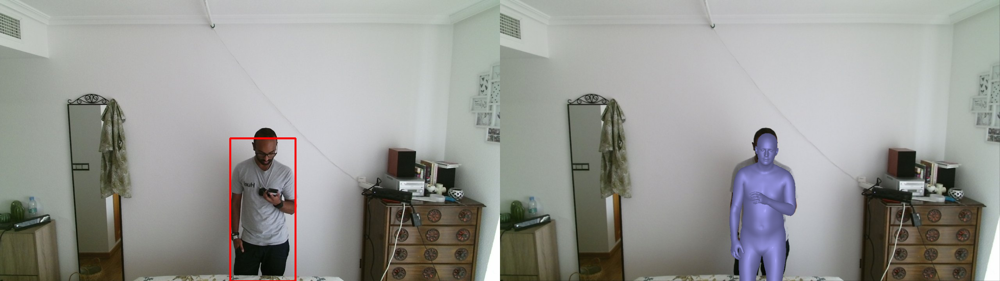

In [14]:
renderings_dir = '/home/sid/Projects/OmniScience/src/frankmocap/test-setup/Rendering-17-Nov/rendered'
rendered_file = os.path.join(renderings_dir, random_img)

img = Image.open(rendered_file)
img

In [15]:
rgb_dir = '/home/sid/Projects/OmniScience/dataset/2022-10-06/bedroom/sid/round1/capture0/rgb'

# img = Image.open(os.path.join(rgb_dir, random_img))
# img

In [16]:
img.size

In [17]:
# Inspecting the image centric coordinates of the mesh vertices
smpl_coord_dict = {}
for i in pickle_files:
    obj = pd.read_pickle(i)
    if obj['pred_output_list'][0] != None:
        smpl_coord_dict[os.path.basename(obj['image_path'])] = obj['pred_output_list'][0]['pred_vertices_smpl']

In [18]:
pcloud_smpl = smpl_coord_dict[random_img]
x,y,z = pcloud_smpl[:, 0], pcloud_smpl[:, 1], pcloud_smpl[:, 2]

fig = px.scatter_3d(x=x, y=y, z=z,)
fig.show()

In [19]:
extremities = [
    [min(x),min(y),min(z)],
    [max(x),min(y),min(z)],
    [min(x),max(y),min(z)],
    [min(x),min(y),max(z)],    
    [max(x),max(y),min(z)],
    [max(x),min(y),max(z)],
    [min(x),max(y),max(z)],
    [max(x),max(y),max(z)]
]
print(extremities)
pcloud4 = np.append(pcloud_smpl, extremities, axis=0)

x,y,z = pcloud4[:, 0], pcloud4[:, 1], pcloud4[:, 2]
fig = px.scatter_3d(x=x, y=y, z=z,)
fig.show()

[[-0.2632, -1.165, -0.389], [0.2627, -1.165, -0.389], [-0.2632, 0.532, -0.389], [-0.2632, -1.165, 0.3984], [0.2627, 0.532, -0.389], [0.2627, -1.165, 0.3984], [-0.2632, 0.532, 0.3984], [0.2627, 0.532, 0.3984]]


In [20]:
import open3d as o3d

pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(pcloud3)
# o3d.io.write_point_cloud("./data.ply", pcd)

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [21]:
import pytorch3d
import torch
from pytorch3d.io import ply_io
from pytorch3d.structures import Meshes

verts = torch.from_numpy(pcloud3).unsqueeze(0)
faces = torch.from_numpy(obj['pred_output_list'][0]['faces'].astype(np.float64)).unsqueeze(0)

mesh = Meshes(verts=verts, faces=faces)

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 



/home/sid/Projects/OmniScience/dataset/2022-10-06/bedroom/sid/round1/capture0/depth/1665057394063.png


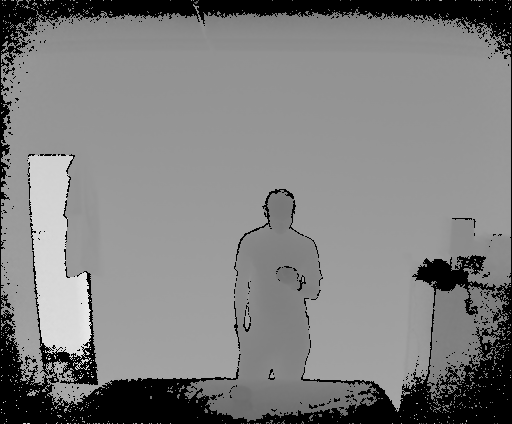

In [22]:
depth_images_dir = '/home/sid/Projects/OmniScience/dataset/2022-10-06/bedroom/sid/round1/capture0/depth'
random_img = random_img.replace('.jpg', '.png')
file = os.path.join(depth_images_dir, random_img)
print(file)

depth_intensity = np.array(256 * np.array(Image.open(file)) / 0x0fff, dtype=np.uint8)
Image.fromarray(depth_intensity)


In [23]:

spec = importlib.util.spec_from_file_location("load_matlab_calibration", "/home/sid/Projects/OmniScience/src/reprojection-main/reproject/utils/load_matlab_calibration.py")
foo = importlib.util.module_from_spec(spec)
sys.modules["load_matlab_calibration"] = foo
spec.loader.exec_module(foo)
stereo_matrix = foo.get_stereo_calibration_matrices('/home/sid/Projects/OmniScience/src/frankmocap/test-setup/stereoParams_k0.json')

In [24]:
fd = open('/home/sid/Projects/OmniScience/src/frankmocap/test-setup/stereoParams_k0_correctlysized.json', 'r')
params = json.load(fd)
fd.close()
params.keys()

dict_keys(['CameraParameters1', 'CameraParameters2', 'RotationOfCamera2', 'TranslationOfCamera2', 'FundamentalMatrix', 'EssentialMatrix', 'MeanReprojectionError', 'NumPatterns', 'WorldPoints', 'WorldUnits'])

In [25]:
params['CameraParameters1'].keys()

dict_keys(['ImageSize', 'RadialDistortion', 'TangentialDistortion', 'WorldPoints', 'WorldUnits', 'EstimateSkew', 'NumRadialDistortionCoefficients', 'EstimateTangentialDistortion', 'TranslationVectors', 'ReprojectionErrors', 'DetectedKeypoints', 'RotationVectors', 'NumPatterns', 'Intrinsics', 'IntrinsicMatrix', 'FocalLength', 'PrincipalPoint', 'Skew', 'MeanReprojectionError', 'ReprojectedPoints', 'RotationMatrices'])

In [26]:
params['CameraParameters1']['TangentialDistortion']
params['CameraParameters1']['RadialDistortion']

In [27]:
params['CameraParameters1']['Intrinsics']

{'FocalLength': [703.2992038810186, 704.6092702456839],
 'PrincipalPoint': [647.7917663694784, 358.8273974931908],
 'ImageSize': [720, 1280],
 'RadialDistortion': [0.04083007765643239,
  0.0006089929233118465,
  -0.07136711742415364],
 'TangentialDistortion': [0.000623879471902834, 0.0005215675252999318],
 'Skew': 0.9819845456153447,
 'IntrinsicMatrix': [[703.2992038810186, 0, 0],
  [0.9819845456153447, 704.6092702456839, 0],
  [647.7917663694784, 358.8273974931908, 1]]}

In [28]:
random_img = random_img.replace('.png', '.jpg')
pcloud = img_coord_dict[random_img]
x, y, z = pcloud.T


In [29]:
pcloud

array([[702.5 , 390.5 , -49.38],
       [703.5 , 391.  , -49.56],
       [704.  , 390.5 , -49.6 ],
       ...,
       [670.5 , 383.8 , -72.06],
       [671.5 , 383.5 , -71.7 ],
       [672.  , 383.2 , -71.44]], dtype=float16)

In [30]:
intrinsics1 = np.array(params['CameraParameters1']['IntrinsicMatrix']).T



In [31]:
inv_intrinsics1 = np.linalg.inv(intrinsics1) # intrinsic matrix seems to be transposed though
pcloud_inversed = inv_intrinsics1 @ pcloud.T

In [32]:
intrinsics1

array([[703.29920388,   0.98198455, 647.79176637],
       [  0.        , 704.60927025, 358.82739749],
       [  0.        ,   0.        ,   1.        ]])

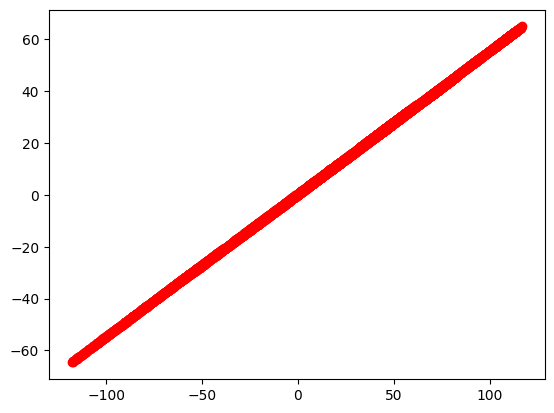

In [33]:
x, y = pcloud_inversed[0], pcloud_inversed[1]

# put a red dot, size 40, at 2 locations:
plt.scatter(x=x, y=y, c='r')
plt.show()

In [34]:
pcloud_inversed = pcloud_inversed[:-1]
print(pcloud_inversed)

[[46.44109146 46.6150807  46.64455402 ... 67.27637664 66.93266229
  66.70328257]
 [25.69878586 25.79498121 25.81018589 ... 37.24298053 37.05165424
  36.92398512]]


In [35]:
z1 = z[np.newaxis, ...]

In [36]:
pcloud_inversed = np.append(pcloud_inversed, z1, axis=0)

In [37]:
x, y, z = pcloud_inversed[0], pcloud_inversed[1], pcloud_inversed[2]

fig = px.scatter_3d(x=x, y=y, z=z)
fig.show()

In [38]:
rot = np.array(params['RotationOfCamera2'])
trans = np.array(params['TranslationOfCamera2']).reshape(1, 3)
transformation_matrix = np.concatenate((rot, trans.T), axis=1)
transformation_matrix = np.concatenate((transformation_matrix, np.array([0,0,0,1]).T.reshape(1,4)), axis=0)

pcloud_appended = np.append(pcloud_inversed.T, np.ones((pcloud.shape[0], 1)), axis=1)

In [39]:
# Try 2 - with separate rotation and translation matrices
pcl1 = rot @ pcloud_inversed
pcl2 = pcl1 + trans.T
depth_cloud_camera = pcl2

In [40]:
trans

array([[52.35601763, -0.08669863,  0.56504903]])

In [41]:
transformation_matrix

array([[ 9.99995164e-01,  2.05839361e-03,  2.33138130e-03,
         5.23560176e+01],
       [-2.06324629e-03,  9.99995706e-01,  2.08097421e-03,
        -8.66986311e-02],
       [-2.32708783e-03, -2.08577436e-03,  9.99995117e-01,
         5.65049035e-01],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.00000000e+00]])

In [42]:
depth_cloud_camera = transformation_matrix @ pcloud_appended.T
depth_cloud_camera

array([[ 98.73467077,  98.90842004,  98.93785166, ..., 119.54072446,
        119.19749221, 118.96843366],
       [ 25.41340937,  25.50885515,  25.52393392, ...,  36.86735405,
         36.67751812,  36.55084305],
       [-48.97138424, -49.15948885, -49.190839  , ..., -71.73133758,
        -71.3551405 , -71.10434164],
       [  1.        ,   1.        ,   1.        , ...,   1.        ,
          1.        ,   1.        ]])

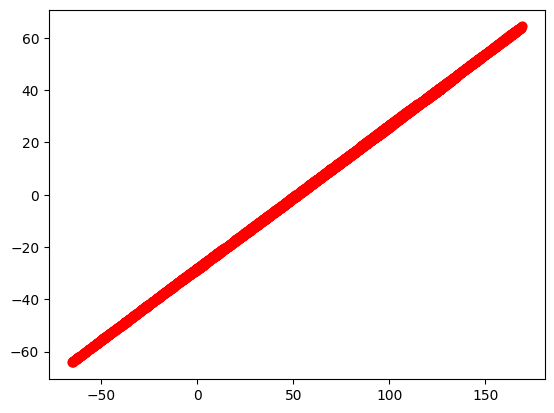

In [43]:
x, y = depth_cloud_camera[0], depth_cloud_camera[1]
# implot = plt.imshow(depth_intensity)


# put a red dot, size 40, at 2 locations:
plt.scatter(x=x, y=y, c='r', s=40)
plt.show()

In [44]:
x, y, z = depth_cloud_camera[0], depth_cloud_camera[1], depth_cloud_camera[2]

fig = px.scatter_3d(x=x, y=y, z=z)
fig.show()

In [45]:
depth_cloud_camera = depth_cloud_camera[:-1]

In [46]:
intrinsics2 = np.array(params['CameraParameters2']['IntrinsicMatrix']).T
depth_cloud_image = intrinsics2 @ depth_cloud_camera

In [47]:
depth_cloud_image.shape

In [48]:
intrinsics2

array([[3.62979254e+02, 3.31464299e-01, 6.37463349e+02],
       [0.00000000e+00, 3.63718091e+02, 3.62008318e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

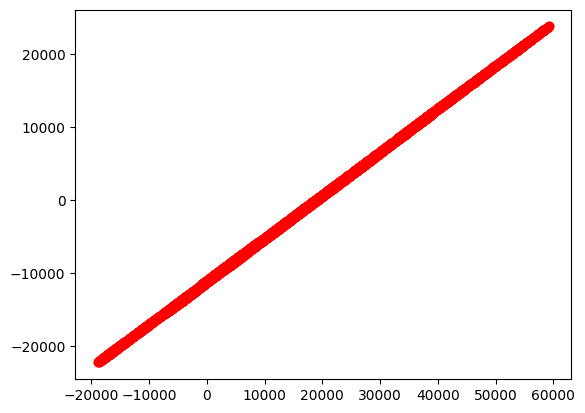

In [49]:
x, y = depth_cloud_image[0], depth_cloud_image[1]
x, y = x, y
# implot = plt.imshow(depth_intensity)


# put a red dot, size 40, at 2 locations:
plt.scatter(x=x, y=y, c='r', s=40)
plt.show()

In [50]:
x, y, z = depth_cloud_image[0], depth_cloud_image[1], depth_cloud_image[2]

fig = px.scatter_3d(x=x, y=y, z=z)
fig.show()

In [51]:
pcloud.shape

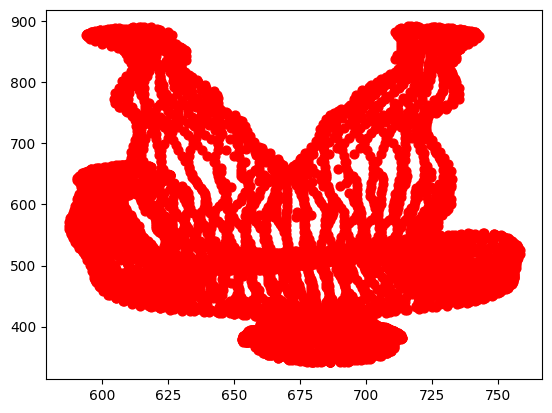

In [52]:
# Raytracing method
x, y = pcloud[:,0], pcloud[:,1]
# implot = plt.imshow(depth_intensity)


# put a red dot, size 40, at 2 locations:
plt.scatter(x=x, y=y, c='r', s=40)
plt.show()

In [53]:
rgb_dir = '/home/sid/Projects/OmniScience/dataset/2022-10-06/bedroom/sid/round1/capture0/rgb'
im = plt.imread(os.path.join(rgb_dir, random_img))

img_shape = cv2.imread(os.path.join(rgb_dir, random_img)).shape
img_shape

In [54]:
blank_array = np.zeros([img_shape[0], img_shape[1], img_shape[2]])

x = np.clip(x, a_min=0, a_max=img_shape[1]-1)
y = np.clip(y, a_min=0, a_max=img_shape[0]-1)

for i, j in zip(x, y):
    blank_array[int(j), int(i)] = 1


matplotlib.image.imsave("/home/sid/Projects/OmniScience/src/frankmocap/test-setup/Rendering-17-Nov/points-as-png/test.png", blank_array)

In [55]:
f_x, f_y, c_x, c_y = sym.symbols('f_x, f_y, c_x, c_y')
K = sym.Matrix([[f_x, 0, c_x], [0, f_y, c_y], [0,0,1]])
K

⎡fₓ   0   cₓ ⎤
⎢            ⎥
⎢0   f_y  c_y⎥
⎢            ⎥
⎣0    0    1 ⎦

In [56]:
K_inv = K.inv()
K_inv

⎡1        -cₓ  ⎤
⎢──   0   ──── ⎥
⎢fₓ        fₓ  ⎥
⎢              ⎥
⎢     1   -c_y ⎥
⎢0   ───  ─────⎥
⎢    f_y   f_y ⎥
⎢              ⎥
⎣0    0     1  ⎦

In [57]:
img_coordinates = sym.Matrix([sym.symbols('x'), sym.symbols('y'), sym.symbols('z')])
camera_coordinates = K_inv * img_coordinates
camera_coordinates

⎡   cₓ⋅z   x  ⎤
⎢ - ──── + ── ⎥
⎢    fₓ    fₓ ⎥
⎢             ⎥
⎢  c_y⋅z    y ⎥
⎢- ───── + ───⎥
⎢   f_y    f_y⎥
⎢             ⎥
⎣      z      ⎦

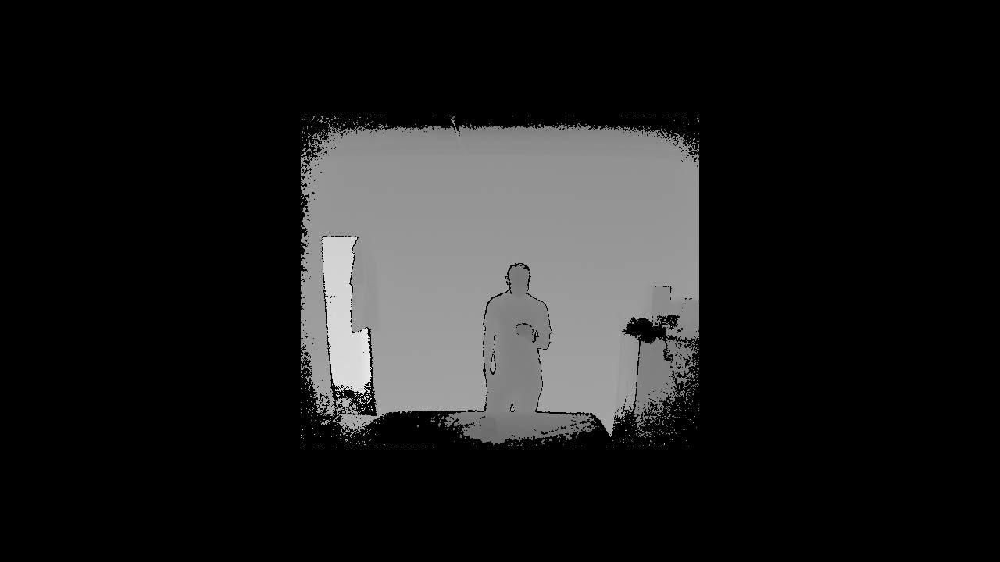

In [58]:
# Creating the larger depth image to embed into (this was used during stereo calibration)
imgpath = os.path.join(rgb_dir, random_img)
r, c, _ = cv2.imread(imgpath).shape
depth_bigger = np.zeros((r, c, 3), dtype=np.uint8)
nr, nc = depth_intensity.shape
depthimg = cv2.merge((depth_intensity,depth_intensity,depth_intensity))
depth_bigger[int(r/2-nr/2):int(r/2+nr/2), int(c/2-nc/2):int(c/2+nc/2)] = depthimg
Image.fromarray(depth_bigger)

img:  [702.5 703.5 704.  ... 670.5 671.5 672. ] [390.5 391.  390.5 ... 383.8 383.5 383.2]
[ 0.04083008  0.00060899  0.00062388  0.00052157 -0.07136712]
undistorted:  [0.07774753 0.07916747 0.07987789 ... 0.03228143 0.03370289 0.03441364] [0.04492461 0.04563307 0.04492368 ... 0.03536332 0.0350084  0.03465359]
[ 1.11594986e-01 -3.46194274e-01  8.80495864e-04 -2.47815171e-04
  1.85002249e-01]


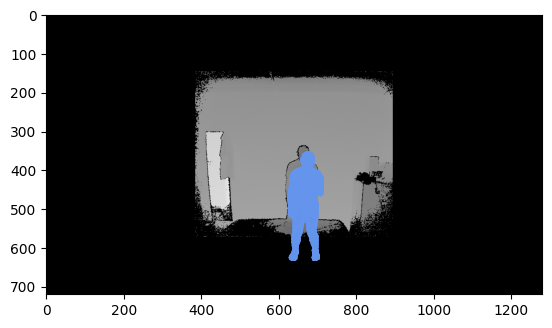

In [59]:
def get_distortion_matrix(params):
    Dk = np.asarray(params["RadialDistortion"])
    Dp = np.asarray(params["TangentialDistortion"])
    if len(Dk) == 3:
        distortion = np.asarray([Dk[0], Dk[1], Dp[0], Dp[1], Dk[2]])
    else:
        distortion = np.asarray([Dk[0], Dk[1], Dp[0], Dp[1]])
    print(distortion)
    return distortion


def undistort_points(params, x, y):
    distortion = get_distortion_matrix(params)
    intrinsics = np.array(params['IntrinsicMatrix']).T
    temp = cv2.undistortPoints(
        src=np.vstack((x,y)).astype(np.float64), 
        cameraMatrix=intrinsics, #fk.kinect_params[k_idx]['K'],
        distCoeffs=distortion) #fk.kinect_params[k_idx]['D']
    x, y = np.squeeze(np.array(temp), axis=1).T
    return x, y


def transform_RGBimgcoords_to_depthimgcoords(
        pcloud,
        depth_frame,
        depth_params,
        color_params,
        fk,
        R, T):
    """_summary_: Function to transform the image coordinate system to the depth coordinate system

    Args:
        x, y, z (_type_): RGB image coordinates of the mesh
        depth_frame (_type_):  the depth image onto which the mesh points will be projected
        depth_params (_type_): intrinsics of the depth camera
        color_params (_type_): intrinsics of the RGB camera
        R (_type_): Rotation matrix to go from RGB to depth
        T (_type_): Translation vector to go from RGB to depth

    Returns:
        _type_: Depth image coordinates of the mesh
    """


    ## Transform the RGB image coordinates to the RGB camera coordinates
    x, y, z_original = pcloud.T
    z = np.ones(z_original.shape)

    # Undistorting the points
    print("img: ", x,y)
    x, y = undistort_points(color_params, x, y)
    
    rgb_Fx, rgb_Fy = color_params["FocalLength"]
    rgb_Cx, rgb_Cy = color_params["PrincipalPoint"]
    rgb_camera_coordinates = np.zeros((len(x), 3))
    
    rgb_camera_coordinates[:, 0] = x #z * (x - rgb_Cx) / rgb_Fx 
    rgb_camera_coordinates[:, 1] = y #z * (y - rgb_Cy) / rgb_Fy 
    rgb_camera_coordinates[:, 2] = z

    ### Transform the RGB camera coordinates to the depth camera coordinates using the extrinsic stereo parameters
    depth_camera_coordinates = np.dot(rgb_camera_coordinates, R) + (T / 1000.)

    ### Transform the depth camera coordinates to the depth image coordinates
    # depth_Fx, depth_Fy = depth_params["FocalLength"]
    # depth_Cx, depth_Cy = depth_params["PrincipalPoint"]
    # depthX = depth_camera_coordinates[:, 0] * depth_Fx / depth_camera_coordinates[:, 2] + depth_Cx 
    # depthY = depth_camera_coordinates[:, 1] * depth_Fy / depth_camera_coordinates[:, 2] + depth_Cy

    distortion = get_distortion_matrix(depth_params)
    points, _ = cv2.projectPoints(depth_camera_coordinates, rvec=(0, 0, 0), tvec=(0, 0, 0), cameraMatrix=intrinsics2, distCoeffs=distortion)
    depthX, depthY = np.squeeze(np.array(points), axis=1).T
    depthZ = z_original

    return depthX, depthY, depthZ
    

rot = np.array(params['RotationOfCamera2'])
trans = np.array(params['TranslationOfCamera2']).reshape(1, 3)

depthX, depthY, depthZ = transform_RGBimgcoords_to_depthimgcoords(
        pcloud,
        depth_frame=depth_intensity,
        depth_params=params['CameraParameters2'],
        color_params=params['CameraParameters1'],
        fk=None,
        R=rot, T=trans)

implot = plt.imshow(depth_bigger)
plt.scatter(x=depthX, y=depthY, c='cornflowerblue', s=0.5)
plt.show()

In [60]:
512/424

In [61]:
# from plotly.graph_objs import Scatter3d as scat

# fig = scat(x=depthX, y=depthY, z=depthZ, marker=Marker(size=1))

fig = px.scatter_3d(x=depthX, y=depthY, z=depthZ)
fig.update_traces(marker={'size': 1})
fig.update_layout(
    autosize=False,
    width=500,
    height=500)
fig.show()

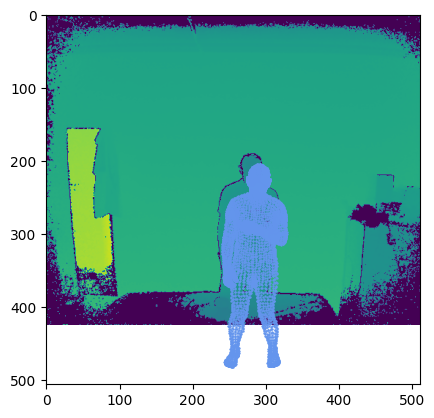

In [62]:
# Shifting the mesh to the top left corner of the depth image
xmin, xmax = int(c/2-nc/2), int(c/2+nc/2)
ymin, ymax = int(r/2-nr/2), int(r/2+nr/2)
depthX -= xmin
depthY -= ymin

implot = plt.imshow(depth_intensity)
plt.scatter(x=depthX, y=depthY, c='cornflowerblue', s=0.5)
plt.show()

In [63]:
camera_distance_lookup = {}
for i, j in zip(depthX, depthY):
    if 0 <= i < 512 and 0 <= j < 424:
        camera_distance_lookup[depth_intensity[int(j), int(i)]] = (i, j)

## Reverse dictionary lookup
# val = 16
# print(list(mydict.keys())[list(mydict.values()).index(val)]) 
depthZ_shifted = depthZ - min(depthZ)

In [64]:
depth_img_mesh = np.vstack((depthX, depthY, depthZ_shifted))
depth_img_mesh

array([[299.85844715, 300.37561759, 300.63478311, ..., 283.31795635,
        283.8348114 , 284.09335796],
       [229.6389224 , 229.89868172, 229.64111018, ..., 226.10904606,
        225.98128851, 225.85287857],
       [ 76.8125    ,  76.625     ,  76.625     , ...,  54.125     ,
         54.5       ,  54.75      ]])

In [66]:
import random

def get_z_randomly(depth_img_mesh, camera_distance_lookup):
    camera_distance = random.sample(camera_distance_lookup.keys(), 1)[0]
    pointX, pointY  = camera_distance_lookup[camera_distance]
    ix = np.where(depth_img_mesh[0] == pointX)

    if depth_img_mesh[1, ix] == pointY:
        z = depth_img_mesh[2, ix]
    return z, camera_distance


scales = []
for i in range(1000):
    z1, cam_dist1 = get_z_randomly(depth_img_mesh, camera_distance_lookup)
    z2, cam_dist2 = get_z_randomly(depth_img_mesh, camera_distance_lookup)
    print(z1, cam_dist1, z2, cam_dist2)
    scale = (z1 - z2) / (cam_dist1 - cam_dist2)
    print(scale)
    scales.append(scale)

[[149.]] 116 [[51.125]] 126
[[0.39786585]]
[[51.125]] 126 [[41.25]] 134
[[0.03981855]]
[[68.625]] 129 [[123.625]] 150
[[-0.23404255]]


/home/sid/anaconda3/envs/frank/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning:

overflow encountered in ubyte_scalars



ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()